# EDA on audio data

In [1]:
import matplotlib.pyplot as plt
import librosa, librosa.display
import numpy as np
from pathlib import Path
import IPython.display as ipd
import sklearn

import sys

if not sys.warnoptions:
    import warnings
    warnings.simplefilter("ignore")

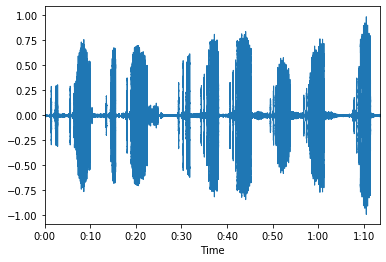

In [45]:
#loading a sound file 
bird_sound, sr = librosa.load('../birding/recordings/Northern_cardinal/109034.mp3', duration=120)
librosa.display.waveplot(bird_sound, sr);

In [46]:
ipd.Audio(data=bird_sound,rate=sr)

In [47]:
#Extracting foreground noice from background noise
S_full, phase = librosa.magphase(librosa.stft(bird_sound))

In [ ]:
# We'll compare frames using cosine similarity, and aggregate similar frames
# by taking their (per-frequency) median value.
#
# To avoid being biased by local continuity, we constrain similar frames to be
# separated by at least 2 seconds.
#
# This suppresses sparse/non-repetetitive deviations from the average spectrum,
# and works well to discard vocal elements.


S_filter = librosa.decompose.nn_filter(S_full,
                                       aggregate=np.median,
                                       metric='cosine',
                                       width=int(librosa.time_to_frames(2, sr=sr)))

# The output of the filter shouldn't be greater than the input
# if we assume signals are additive.  Taking the pointwise minimium
# with the input spectrum forces this.
S_filter = np.minimum(S_full, S_filter)

# We can also use a margin to reduce bleed between the vocals and instrumentation masks.
# Note: the margins need not be equal for foreground and background separation
margin_i, margin_v = 2, 10
power = 2

mask_i = librosa.util.softmask(S_filter,
                               margin_i * (S_full - S_filter),
                               power=power)

mask_v = librosa.util.softmask(S_full - S_filter,
                               margin_v * S_filter,
                               power=power)

# Once we have the masks, simply multiply them with the input spectrum
# to separate the components

S_foreground = mask_v * S_full
S_background = mask_i * S_full

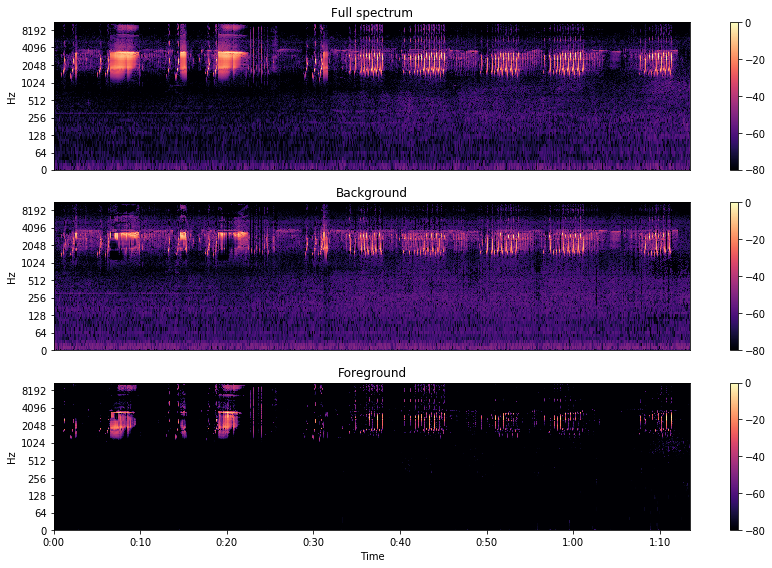

In [6]:
# sphinx_gallery_thumbnail_number = 2
plt.figure(figsize=(12, 8))
plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(S_full, ref=np.max),
                         y_axis='log', sr=sr)
plt.title('Full spectrum')
plt.colorbar()

plt.subplot(3, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(S_background, ref=np.max),
                         y_axis='log', sr=sr)
plt.title('Background')
plt.colorbar()
plt.subplot(3, 1, 3)
librosa.display.specshow(librosa.amplitude_to_db(S_foreground, ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.title('Foreground')
plt.colorbar()
plt.tight_layout()
plt.show()

In [7]:
D_foreground = S_foreground * phase
y_foreground = librosa.istft(D_foreground)
librosa.output.write_wav('./datasets/converted_foreground.wav', y_foreground, sr)

In [16]:
converted_sound, sr = librosa.load('./datasets/converted_foreground.wav', mono=True)

In [17]:
ipd.Audio(data=converted_sound,rate=sr)

In [18]:
D_background = S_background * phase
y_background = librosa.istft(D_background)
librosa.output.write_wav('./datasets/converted_background.wav', y_background, sr)
converted_background, sr = librosa.load('./datasets/converted_background.wav', mono=True)
ipd.Audio(data=converted_background,rate=sr)

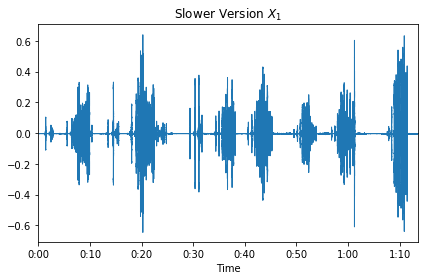

In [20]:
librosa.display.waveplot(converted_sound, sr=sr)
plt.title('Slower Version $X_1$')
plt.tight_layout()

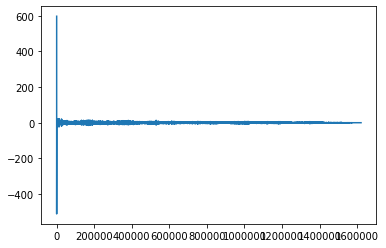

In [22]:
y, sr = librosa.load('./datasets/converted_background.wav', mono=True)
plt.plot(librosa.autocorrelate(y));

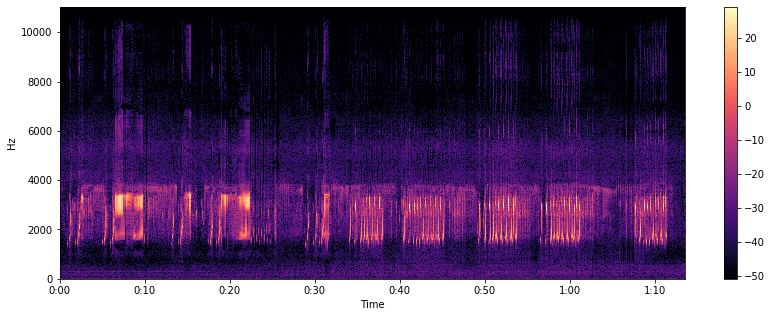

In [25]:
X = librosa.stft(y)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar();

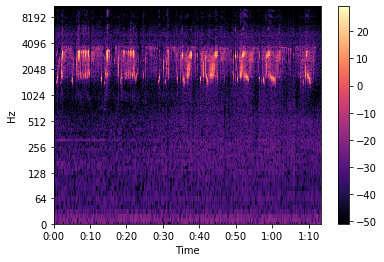

In [26]:
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
plt.colorbar();

In [30]:
spectral_centroids = librosa.feature.spectral_centroid(y, sr=sr)[0]
spectral_centroids.shape

(3166,)

In [32]:
# Computing the time variable for visualization
plt.figure(figsize=(12, 4))
frames = range(len(spectral_centroids));

<Figure size 864x288 with 0 Axes>

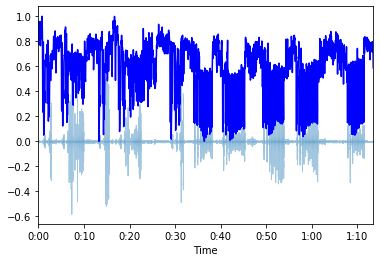

In [34]:
t = librosa.frames_to_time(frames)
# Normalising the spectral centroid for visualisation
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)
#Plotting the Spectral Centroid along the waveform
librosa.display.waveplot(y, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_centroids), color='b')

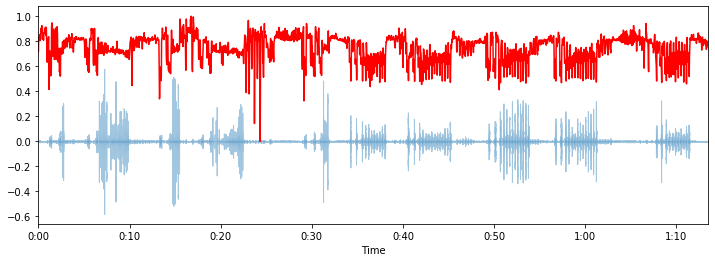

In [47]:
spectral_rolloff = librosa.feature.spectral_rolloff(y+0.01, sr=sr)[0]
plt.figure(figsize=(12, 4))
librosa.display.waveplot(y, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_rolloff), color='r');

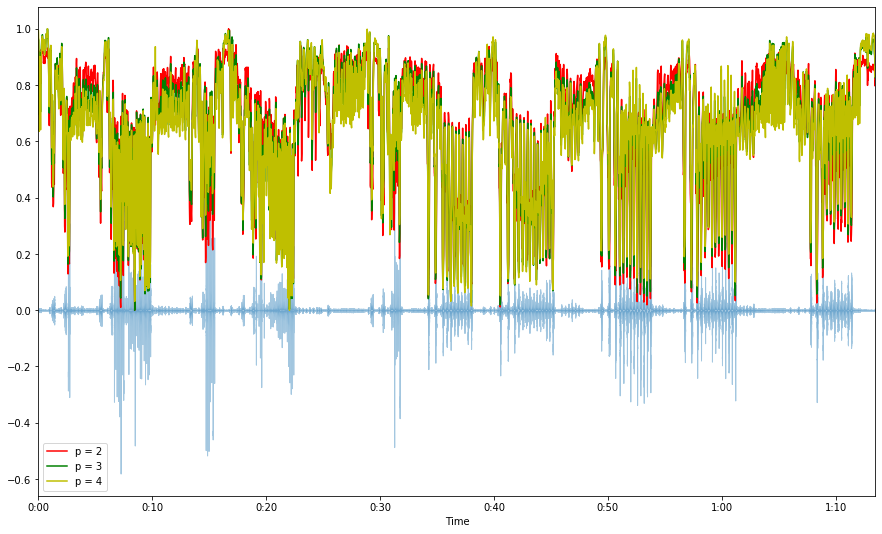

In [48]:
spectral_bandwidth_2 = librosa.feature.spectral_bandwidth(y+0.01, sr=sr)[0]
spectral_bandwidth_3 = librosa.feature.spectral_bandwidth(y+0.01, sr=sr, p=3)[0]
spectral_bandwidth_4 = librosa.feature.spectral_bandwidth(y+0.01, sr=sr, p=4)[0]
plt.figure(figsize=(15, 9))
librosa.display.waveplot(y, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_bandwidth_2), color='r')
plt.plot(t, normalize(spectral_bandwidth_3), color='g')
plt.plot(t, normalize(spectral_bandwidth_4), color='y')
plt.legend(('p = 2', 'p = 3', 'p = 4'));

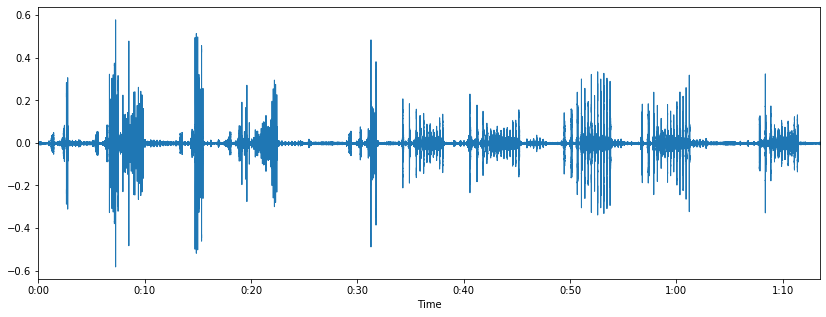

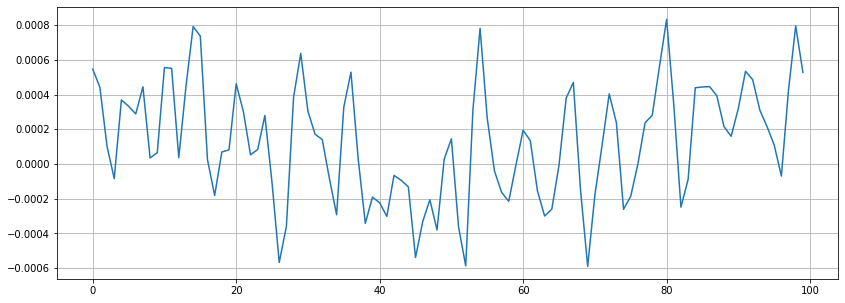

In [40]:

#Plot the signal:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(y, sr=sr)
# Zooming in
n0 = 9000
n1 = 9100
plt.figure(figsize=(14, 5))
plt.plot(y[n0:n1])
plt.grid()

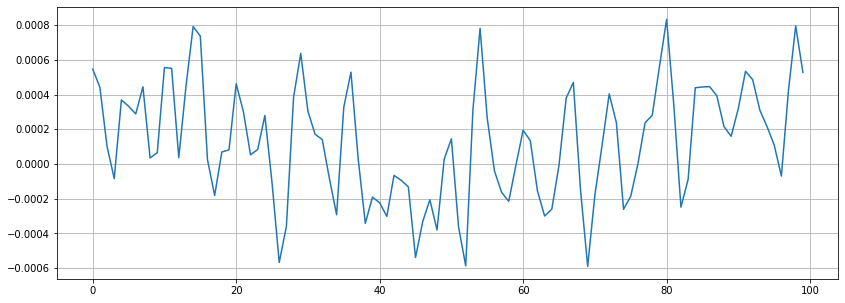

In [41]:
n0 = 9000
n1 = 9100
plt.figure(figsize=(14, 5))
plt.plot(y[n0:n1])
plt.grid()

(20, 3166)


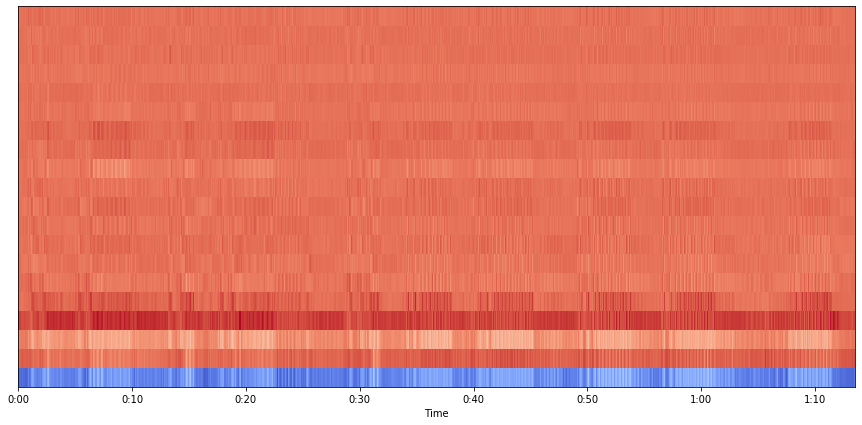

In [49]:
mfccs = librosa.feature.mfcc(y, sr=sr)
print(mfccs.shape)
#Displaying  the MFCCs:
plt.figure(figsize=(15, 7))
librosa.display.specshow(mfccs, sr=sr, x_axis='time');

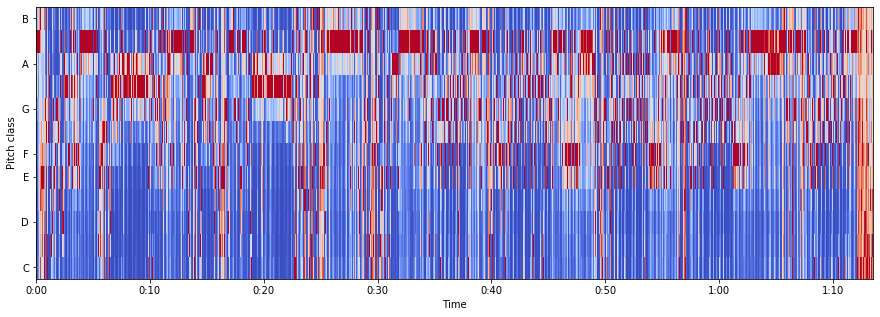

In [46]:
chromagram = librosa.feature.chroma_stft(y, sr=sr, hop_length=510)
plt.figure(figsize=(15, 5))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=510, cmap='coolwarm');